In [2]:
# CELL 1: Function Definitions (RUN THIS CELL FIRST)

import requests
import xml.etree.ElementTree as ET
import re
import time
import pandas as pd
from collections import Counter, defaultdict
import json

# --- PubMed API Interaction ---

def search_pubmed(query, retmax=100):
    """Search PubMed and return PMIDs using history server."""
    print(f"Searching PubMed for: '{query}' (max {retmax} results)")
    base_url = "https://eutils.ncbi.nlm.nih.gov/entrez/eutils/"
    search_url = f"{base_url}esearch.fcgi"
    params = {
        "db": "pubmed",
        "term": query,
        "retmax": str(retmax),
        "usehistory": "y" # IMPORTANT: Enable history server
    }
    try:
        response = requests.get(search_url, params=params)
        response.raise_for_status()
        root = ET.fromstring(response.content)
        pmids = [pmid.text for pmid in root.findall('.//IdList/Id')]
        webenv = root.find('.//WebEnv').text
        query_key = root.find('.//QueryKey').text
        count = root.find('.//Count').text
        print(f"Found {count} PMIDs total. Returning first {len(pmids)}. History server enabled (WebEnv/QueryKey acquired).")
        return pmids, webenv, query_key
    except requests.exceptions.RequestException as e:
        print(f"Error searching PubMed: {e}")
        return [], None, None
    except ET.ParseError as e:
        print(f"Error parsing PubMed search response: {e}")
        return [], None, None
    except AttributeError: # Handle case where WebEnv or QueryKey might be missing if usehistory fails
         print(f"Error: Could not find WebEnv or QueryKey in response. History server might not be working.")
         return [], None, None


def fetch_pubmed_details(pmids, webenv=None, query_key=None):
    """Fetch details for a list of PMIDs using history server if available, extracting year."""
    print(f"Fetching details for {len(pmids)} PMIDs (using history server if available)...")
    base_url = "https://eutils.ncbi.nlm.nih.gov/entrez/eutils/"
    fetch_url = f"{base_url}efetch.fcgi"
    articles = []
    batch_size = 100 # Fetch in batches

    # Use history server if WebEnv and QueryKey are provided
    use_history = bool(webenv and query_key)
    num_batches = (len(pmids) + batch_size - 1) // batch_size if not use_history else 1 # Only 1 'batch' needed conceptually for history

    fetch_ids = pmids # IDs to fetch in current batch if not using history

    for i in range(num_batches):
        params = {
            "db": "pubmed",
            "rettype": "medline",
            "retmode": "xml",
        }
        if use_history:
             # If using history, fetch all requested PMIDs (up to retmax from search) via WebEnv/QueryKey
             # Note: EFetch might have its own internal retmax limit per request even with history, typically large.
             # We are requesting details for the PMIDs *returned by the initial search* batch.
             # If the search found more than `retmax`, you'd need more sophisticated batching *on the ESearch* side
             # or multiple EFetch calls adjusting `retstart` against the history server.
             # For this prototype, we fetch details for the PMIDs we got from the initial search.
             params.update({ "WebEnv": webenv, "query_key": query_key, "retmax": str(len(pmids)) })
             print("Using History Server (WebEnv/QueryKey) for EFetch.")
        else:
             # If not using history (e.g., if search failed to return WebEnv), fetch by ID in batches
             start_index = i * batch_size
             batch_pmids = pmids[start_index : start_index + batch_size]
             if not batch_pmids: continue
             params["id"] = ",".join(batch_pmids)
             fetch_ids = batch_pmids # Update IDs being fetched in this batch
             print(f"Fetching batch {i+1}/{num_batches} by ID list ({len(batch_pmids)} IDs).")


        try:
            # Use POST for potentially long ID lists or history server params
            response = requests.post(fetch_url, data=params)
            response.raise_for_status()
            # It's good practice to check content type, though NCBI usually sends correct XML
            content_type = response.headers.get('Content-Type', '')
            if 'xml' not in content_type.lower():
                print(f"Warning: Expected XML response but got Content-Type: {content_type}")
                # Handle unexpected content type if necessary, maybe skip batch
                continue

            # Check for empty or malformed response before parsing
            if not response.content:
                 print(f"Warning: Received empty response for batch/history fetch.")
                 continue

            root = ET.fromstring(response.content)

            fetched_count_in_batch = 0
            for article_xml in root.findall('.//PubmedArticle'):
                # ... (rest of the parsing logic from previous response remains the same) ...
                pmid_node = article_xml.find('.//PMID')
                pmid = pmid_node.text if pmid_node is not None else None
                if not pmid: continue

                medline_citation = article_xml.find('.//MedlineCitation')
                if medline_citation is None: continue

                title_node = medline_citation.find('.//Article/ArticleTitle')
                title = title_node.text if title_node is not None else ""

                abstract_node = medline_citation.find('.//Article/Abstract/AbstractText')
                abstract = abstract_node.text if abstract_node is not None else ""
                if not abstract:
                   abstract_parts = medline_citation.findall('.//Article/Abstract/AbstractText')
                   abstract = " ".join([part.text for part in abstract_parts if part.text])

                pub_types = [pt.text for pt in medline_citation.findall('.//Article/PublicationTypeList/PublicationType')]
                languages = [lang.text for lang in medline_citation.findall('.//Article/Language')]

                pub_year = None
                pubdate_node = medline_citation.find('.//Article/Journal/JournalIssue/PubDate')
                if pubdate_node is not None:
                    year_node = pubdate_node.find('Year')
                    if year_node is not None and year_node.text:
                        pub_year = year_node.text
                    else:
                        medline_date_node = pubdate_node.find('MedlineDate')
                        if medline_date_node is not None and medline_date_node.text:
                            match = re.search(r'\b(19|20)\d{2}\b', medline_date_node.text)
                            if match: pub_year = match.group(0)

                if pub_year is None:
                    article_date_node = medline_citation.find('.//Article/ArticleDate/Year')
                    if article_date_node is not None and article_date_node.text:
                        pub_year = article_date_node.text

                try: pub_year_int = int(pub_year) if pub_year else None
                except ValueError: pub_year_int = None

                # --- NEW: Extract References (Cited Articles) ---
                references = []
                reference_list = article_xml.find('.//ReferenceList')
                if reference_list is not None:
                    for ref in reference_list.findall('.//Reference'):
                        ref_citation = ref.find('Citation')
                        ref_ids = ref.find('ArticleIdList')
                        ref_pmid = None
                        if ref_ids is not None:
                             pmid_node = ref_ids.find('.//ArticleId[@IdType="pubmed"]')
                             if pmid_node is not None: ref_pmid = pmid_node.text
                        references.append({
                            "citation_text": ref_citation.text if ref_citation is not None else None,
                            "cited_pmid": ref_pmid
                        })
                # --- End Reference Extraction ---

                articles.append({
                    "pmid": pmid, "title": title, "abstract": abstract,
                    "pub_types": pub_types, "year": pub_year_int,
                    "language": languages[0] if languages else None,
                    "references": references # Add the list of references
                })
                fetched_count_in_batch += 1
            # --- End XML Parsing Loop ---

            print(f"Processed {fetched_count_in_batch} articles from fetch response.")
            # Respect rate limits - essential even with history server for multiple fetches
            time.sleep(0.4)

             # If using history server, we fetch all requested IDs in one go conceptually
            if use_history:
                 break # Exit loop after first (and only) batch

        except requests.exceptions.RequestException as e:
            print(f"Error fetching PubMed details (batch {i+1}): {e}")
        except ET.ParseError as e:
             print(f"Error parsing PubMed fetch XML (batch {i+1}): {e}")
             print("Response snippet:", response.text[:500]) # Show part of the response on error
        except Exception as e:
            print(f"An unexpected error occurred during fetching/parsing (batch {i+1}): {e}")


    print(f"Finished fetching. Retrieved details for {len(articles)} articles.")
    return articles


# Also include the label_article function definition here if it's not in another cell executed earlier
def label_article(pub_types):
    """Crude labeling based on publication types."""
    primary_keywords = ["Randomized Controlled Trial", "Clinical Trial", "Controlled Clinical Trial",
                         "Clinical Study", "Comparative Study", "Evaluation Study", "Validation Study",
                         "Experimental Study"]
    review_keywords = ["Review", "Meta-Analysis", "Systematic Review", "Guideline", "Practice Guideline"]
    is_review = any(pt for pt in pub_types if pt in review_keywords)
    is_primary = any(pt for pt in pub_types if pt in primary_keywords)
    if is_review: return "Review"
    elif is_primary: return "Primary"
    else:
        if "Journal Article" in pub_types: return "Primary" # Defaulting
        return "Unknown"

Searching PubMed for: '(metformin[tiab] OR glucophage[tiab]) AND (aging[mesh] OR longevity[tiab])' (max 200 results)
Found 583 PMIDs total. Returning first 200. History server enabled (WebEnv/QueryKey acquired).
Fetching details for 200 PMIDs (using history server if available)...
Using History Server (WebEnv/QueryKey) for EFetch.
Processed 200 articles from fetch response.
Finished fetching. Retrieved details for 200 articles.

--- Raw Data Overview (Scrollable) ---


Output(layout=Layout(border_bottom='1px solid black', border_left='1px solid black', border_right='1px solid b…


Label distribution:
label
Primary    136
Review      62
Name: count, dtype: int64

--- Training/Evaluating with TF-IDF ---

--- TF-IDF Naive Bayes Evaluation ---
              precision    recall  f1-score   support

     Primary       0.70      0.96      0.81        27
      Review       0.67      0.15      0.25        13

    accuracy                           0.70        40
   macro avg       0.68      0.56      0.53        40
weighted avg       0.69      0.70      0.63        40


--- TF-IDF Linear SVM Evaluation ---
              precision    recall  f1-score   support

     Primary       0.89      0.89      0.89        27
      Review       0.77      0.77      0.77        13

    accuracy                           0.85        40
   macro avg       0.83      0.83      0.83        40
weighted avg       0.85      0.85      0.85        40


--- Training/Evaluating with Sentence-BERT ---
Loading Sentence Transformer model: all-MiniLM-L6-v2...
Model loaded. Generating embeddings...


Batches:   0%|          | 0/7 [00:00<?, ?it/s]

Training SVM on SBERT embeddings...

--- Sentence-BERT + SVM Evaluation ---
Accuracy: 0.7500
              precision    recall  f1-score   support

     Primary       0.81      0.81      0.81        27
      Review       0.62      0.62      0.62        13

    accuracy                           0.75        40
   macro avg       0.72      0.72      0.72        40
weighted avg       0.75      0.75      0.75        40

---------------------------------------------

--- Visualizing Embeddings (UMAP) ---
Running UMAP reduction...


C:\Users\Galaxy\miniconda3\envs\litscape\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\Galaxy\miniconda3\envs\litscape\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


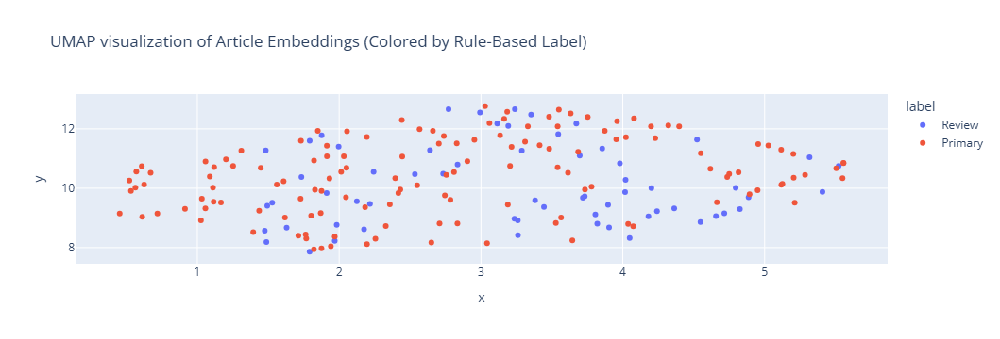


--- Misclassified Examples (SVM on Embeddings) ---


Output(layout=Layout(border_bottom='1px solid black', border_left='1px solid black', border_right='1px solid b…

In [3]:
# CELL 2: Main Execution Block (RUN THIS CELL AFTER CELL 1)

import plotly.express as px
# Make sure other necessary imports like pandas, Pipeline, etc. are available
# (either in Cell 1 or imported again here)
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import LinearSVC
from sklearn.metrics import classification_report, accuracy_score
from sklearn.pipeline import Pipeline
from sentence_transformers import SentenceTransformer
# Use UMAP instead of TSNE
from umap import UMAP # Make sure you installed umap-learn: pip install umap-learn
from IPython.display import display, HTML
import ipywidgets as widgets


# ... (The rest of your main execution code from the previous good block) ...
pubmed_query = "(metformin[tiab] OR glucophage[tiab]) AND (aging[mesh] OR longevity[tiab])"
max_results = 200 # Keep results moderate for prototype speed

# Call functions defined in Cell 1
pmids, webenv, query_key = search_pubmed(pubmed_query, max_results)

if pmids:
    # Fetch details using history server info if available
    article_data = fetch_pubmed_details(pmids, webenv, query_key)
    df = pd.DataFrame(article_data)
else:
    df = pd.DataFrame() # Empty dataframe if search fails

if not df.empty:
    # 3. Combine Text, Apply Labels
    df['text'] = df['title'].fillna('') + " " + df['abstract'].fillna('')
    df['label'] = df['pub_types'].apply(label_article)
    # The 'year' column is now directly populated by fetch_pubmed_details

    # Display Interactive DataFrame
    print("\n--- Raw Data Overview (Scrollable) ---")
    # Add more columns to display, including the new 'year' and maybe reference count
    display_columns = ['pmid', 'year', 'label', 'title', 'language', 'pub_types']
    output_widget = widgets.Output(layout={'border': '1px solid black', 'height': '300px', 'overflow_y': 'scroll'})
    with output_widget:
       # Calculate reference count for display if references were extracted
       if 'references' in df.columns:
           df['ref_count'] = df['references'].apply(len)
           display_columns.append('ref_count')
       display(df[display_columns]) # Show selected columns
    display(output_widget)


    df_labeled = df[df['label'] != 'Unknown'].copy()
    print(f"\nLabel distribution:\n{df_labeled['label'].value_counts()}")

    if len(df_labeled) > 10 and df_labeled['label'].nunique() > 1:
        X = df_labeled['text']
        y = df_labeled['label']
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

        # --- Option A: TF-IDF Pipelines ---
        print("\n--- Training/Evaluating with TF-IDF ---")
        nb_pipeline_tfidf = Pipeline([('tfidf', TfidfVectorizer(stop_words='english', max_df=0.9, min_df=3)), ('clf', MultinomialNB())])
        svm_pipeline_tfidf = Pipeline([('tfidf', TfidfVectorizer(stop_words='english', max_df=0.9, min_df=3)), ('clf', LinearSVC(random_state=42, dual='auto'))])
        nb_pipeline_tfidf.fit(X_train, y_train)
        svm_pipeline_tfidf.fit(X_train, y_train)
        print("\n--- TF-IDF Naive Bayes Evaluation ---")
        y_pred_nb_tfidf = nb_pipeline_tfidf.predict(X_test)
        print(classification_report(y_test, y_pred_nb_tfidf))
        print("\n--- TF-IDF Linear SVM Evaluation ---")
        y_pred_svm_tfidf = svm_pipeline_tfidf.predict(X_test)
        print(classification_report(y_test, y_pred_svm_tfidf))


        # --- Option B: Sentence-BERT Embeddings + Classifier ---
        print("\n--- Training/Evaluating with Sentence-BERT ---")
        model_name = 'all-MiniLM-L6-v2'
        print(f"Loading Sentence Transformer model: {model_name}...")
        sbert_model = SentenceTransformer(model_name)
        print("Model loaded. Generating embeddings...")
        embeddings = sbert_model.encode(X.tolist(), show_progress_bar=True)
        embed_train, embed_test, y_train_embed, y_test_embed = train_test_split(embeddings, y, test_size=0.2, random_state=42, stratify=y)
        svm_on_embeddings = LinearSVC(random_state=42, dual='auto')
        print("Training SVM on SBERT embeddings...")
        svm_on_embeddings.fit(embed_train, y_train_embed)
        print("\n--- Sentence-BERT + SVM Evaluation ---")
        y_pred_svm_embed = svm_on_embeddings.predict(embed_test)
        print(f"Accuracy: {accuracy_score(y_test_embed, y_pred_svm_embed):.4f}")
        print(classification_report(y_test_embed, y_pred_svm_embed))
        print("---------------------------------------------")


        # --- Visualization of Embeddings (UMAP) ---
        print("\n--- Visualizing Embeddings (UMAP) ---")
        sample_indices = np.random.choice(len(embeddings), size=min(len(embeddings), 1000), replace=False)
        sample_embeddings = embeddings[sample_indices]
        sample_labels = y.iloc[sample_indices]

        # Use UMAP
        reducer = UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1) # Typical UMAP params
        print("Running UMAP reduction...")
        embeddings_2d = reducer.fit_transform(sample_embeddings)

        df_plot = pd.DataFrame(embeddings_2d, columns=['x', 'y'])
        df_plot['label'] = sample_labels.values
        df_plot['text_preview'] = X.iloc[sample_indices].str[:100].values

        fig = px.scatter(df_plot, x='x', y='y', color='label',
                         title="UMAP visualization of Article Embeddings (Colored by Rule-Based Label)",
                         hover_data=['text_preview'],
                         labels={'color': 'Rule-Based Label'})
        fig.show()


        # --- Display Misclassified Examples (SVM on Embeddings) ---
        print("\n--- Misclassified Examples (SVM on Embeddings) ---")
        misclassified_indices = np.where(y_test_embed != y_pred_svm_embed)[0]
        original_test_indices = y_test_embed.index
        misclassified_original_indices = original_test_indices[misclassified_indices]
        df_misclassified = df_labeled.loc[misclassified_original_indices].copy()
        df_misclassified['predicted_label'] = y_pred_svm_embed[misclassified_indices]
        output_misclassified = widgets.Output(layout={'border': '1px solid black', 'height': '300px', 'overflow_y': 'scroll'})
        with output_misclassified:
            display(df_misclassified[['pmid', 'year', 'text', 'label', 'predicted_label', 'pub_types']])
        display(output_misclassified)

    else:
        print("\nNot enough labeled data or classes.")

else:
    print("No articles retrieved. Cannot proceed.")

Retrieved 500 PMIDs
Fetched metadata for 500 articles
Citation network: 500 nodes, 1030 edges


Batches:   0%|          | 0/16 [00:00<?, ?it/s]

C:\Users\Galaxy\miniconda3\envs\litscape\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Galaxy\miniconda3\envs\litscape\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



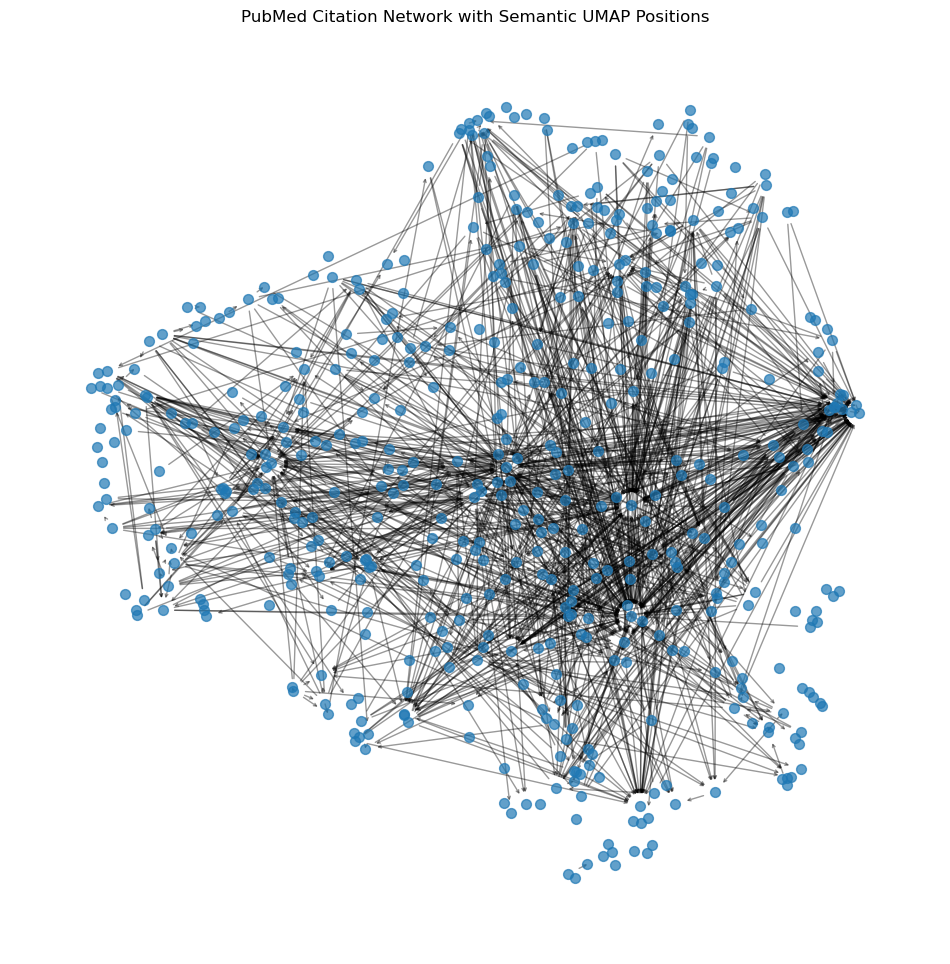

In [6]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-
"""
Script: pubmed_citation_network.py
Author: [Your Name]
Date: [YYYY-MM-DD]

Description:
    This script builds a citation network of PubMed articles matching a given query,
    using NCBI Entrez E-utilities only (esearch + efetch). It then computes semantic
    embeddings for each article using Sentence-BERT, reduces those embeddings to 2D
    coordinates with UMAP, and positions the nodes of the citation graph accordingly.
    Finally, it visualizes the network with node positions reflecting semantic similarity.

What it does, step by step:
    1. Queries PubMed for PMIDs matching a search term (esearch).
    2. Uses the history server (WebEnv, QueryKey) to fetch full article metadata,
       including references (ArticleIdList).
    3. Builds a directed citation graph where each node is an article (PMID) and
       each edge points from citing article to cited article (if the cited PMID
       is also in the fetched set).
    4. Extracts abstracts (or titles if no abstract) for each article.
    5. Generates 384-dimensional SBERT embeddings for each article’s text.
    6. Applies UMAP to reduce embeddings to 2D coordinates.
    7. Assigns each node a (x, y) position from UMAP.
    8. Draws the directed graph using NetworkX and Matplotlib, with node positions
       reflecting semantic similarity and edge arrows denoting citations.

Usage:
    - Adjust `PUBMED_QUERY` and `MAX_RESULTS` as needed.
    - Run in a Jupyter notebook or as a standalone script.
    - Ensure required packages are installed:
        pip install requests pandas networkx matplotlib sentence-transformers umap-learn
"""

import requests
import xml.etree.ElementTree as ET
import time
import re
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

from sentence_transformers import SentenceTransformer
from umap import UMAP

# ------------------------ Configuration ------------------------

PUBMED_QUERY = "(metformin[tiab] OR glucophage[tiab]) AND (aging[mesh] OR longevity[tiab])"
MAX_RESULTS   = 500  # Number of PMIDs to retrieve

# ------------------------ Helper Functions ------------------------

def search_pubmed(query, retmax=100):
    """
    Use Entrez esearch to retrieve PMIDs for a given query.
    Returns: (pmid_list, WebEnv, QueryKey)
    """
    base_url = "https://eutils.ncbi.nlm.nih.gov/entrez/eutils/esearch.fcgi"
    params = {
        "db": "pubmed",
        "term": query,
        "retmax": str(retmax),
        "usehistory": "y"
    }
    resp = requests.get(base_url, params=params)
    resp.raise_for_status()
    root = ET.fromstring(resp.content)
    pmids = [id_node.text for id_node in root.findall(".//IdList/Id")]
    webenv   = root.findtext(".//WebEnv")
    query_key= root.findtext(".//QueryKey")
    return pmids, webenv, query_key

def fetch_pubmed_details(pmids, webenv, query_key):
    """
    Use Entrez efetch with history server to fetch full article details.
    Extracts title, abstract, and reference PMIDs.
    Returns: list of dicts with keys ['pmid','text','references']
    """
    fetch_url = "https://eutils.ncbi.nlm.nih.gov/entrez/eutils/efetch.fcgi"
    params = {
        "db": "pubmed",
        "retmode": "xml",
        "rettype": "abstract",
        "WebEnv": webenv,
        "query_key": query_key,
        "retmax": str(len(pmids))
    }
    resp = requests.post(fetch_url, data=params)
    resp.raise_for_status()
    root = ET.fromstring(resp.content)

    articles = []
    for art in root.findall(".//PubmedArticle"):
        pmid = art.findtext(".//PMID")
        # Extract title + abstract (fallback to title if no abstract)
        title_node = art.find(".//ArticleTitle")
        abs_nodes  = art.findall(".//Abstract/AbstractText")
        title = title_node.text or ""
        abstract = " ".join([n.text for n in abs_nodes if n.text]) or ""
        text = f"{title}. {abstract}".strip()
        # Extract references
        refs = []
        for ref in art.findall(".//ReferenceList/Reference"):
            cited = ref.find(".//ArticleId[@IdType='pubmed']")
            if cited is not None and cited.text in pmids:
                refs.append(cited.text)
        articles.append({"pmid": pmid, "text": text, "references": refs})
    return articles

# ------------------------ Main Pipeline ------------------------

def build_citation_network(articles):
    """
    Constructs a directed NetworkX graph from the articles list.
    Nodes: pmid
    Edges: (pmid -> cited_pmid)
    """
    G = nx.DiGraph()
    for art in articles:
        G.add_node(art["pmid"])
    for art in articles:
        for cited in art["references"]:
            if G.has_node(cited):
                G.add_edge(art["pmid"], cited)
    return G

def compute_embeddings(texts, model_name="all-MiniLM-L6-v2"):
    """
    Generates SBERT embeddings for a list of texts.
    Returns: numpy array of shape (n_texts, embedding_dim)
    """
    model = SentenceTransformer(model_name)
    embeddings = model.encode(texts, show_progress_bar=True)
    return embeddings

def reduce_embeddings(embeddings, n_components=2, random_state=42):
    """
    Applies UMAP to reduce embeddings to 2D.
    Returns: array of shape (n_samples, 2)
    """
    reducer = UMAP(n_components=n_components, random_state=random_state)
    return reducer.fit_transform(embeddings)

def visualize_network(G, positions, figsize=(12,12), node_size=50, alpha=0.7):
    """
    Draws the citation network G with given positions dict {pmid: (x,y)}.
    """
    plt.figure(figsize=figsize)
    nx.draw_networkx_nodes(G, positions, node_size=node_size, alpha=alpha)
    nx.draw_networkx_edges(G, positions, arrowstyle='->', arrowsize=5, alpha=0.4)
    plt.axis('off')
    plt.title("PubMed Citation Network with Semantic UMAP Positions")
    plt.show()

# ------------------------ Execution ------------------------

if __name__ == "__main__":
    # 1. Search PubMed
    pmids, webenv, query_key = search_pubmed(PUBMED_QUERY, MAX_RESULTS)
    print(f"Retrieved {len(pmids)} PMIDs")

    # 2. Fetch details and references
    articles = fetch_pubmed_details(pmids, webenv, query_key)
    df = pd.DataFrame(articles)
    print(f"Fetched metadata for {len(df)} articles")

    # 3. Build citation graph
    G = build_citation_network(articles)
    print(f"Citation network: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

    # 4. Compute semantic embeddings
    texts = df["text"].tolist()
    embeddings = compute_embeddings(texts)

    # 5. Reduce to 2D for positioning
    coords = reduce_embeddings(embeddings)
    pos = {pmid: tuple(coord) for pmid, coord in zip(df["pmid"], coords)}

    # 6. Visualize
    visualize_network(G, pos)


🔍 Searching PubMed for up to 1000 results...
  → Retrieved 583 PMIDs.
📥 Fetching article metadata and reference lists via EFetch...
  → Fetched details for 583 articles.
📥 Fetching citation links via ELink in batches...
    • Batch 1: PMIDs 1–100
    • Batch 2: PMIDs 101–200
    • Batch 3: PMIDs 201–300
    • Batch 4: PMIDs 301–400
    • Batch 5: PMIDs 401–500
    • Batch 6: PMIDs 501–583
  → Retrieved 522 citation links.
🔗 Building citation+reference graph...
  → Graph: 583 nodes, 2057 edges.
🤖 Loading SBERT model and computing embeddings...
  → Using GPU for SBERT embeddings.


Batches:   0%|          | 0/19 [00:00<?, ?it/s]

🗺 Applying UMAP to reduce embeddings to 2D...


C:\Users\Galaxy\miniconda3\envs\litscape\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\Galaxy\miniconda3\envs\litscape\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  → UMAP projection complete.
📊 Running DBSCAN clustering on embeddings...
  → 1 clusters found (noise label = -1).
🎨 Plotting network with DBSCAN cluster colors...


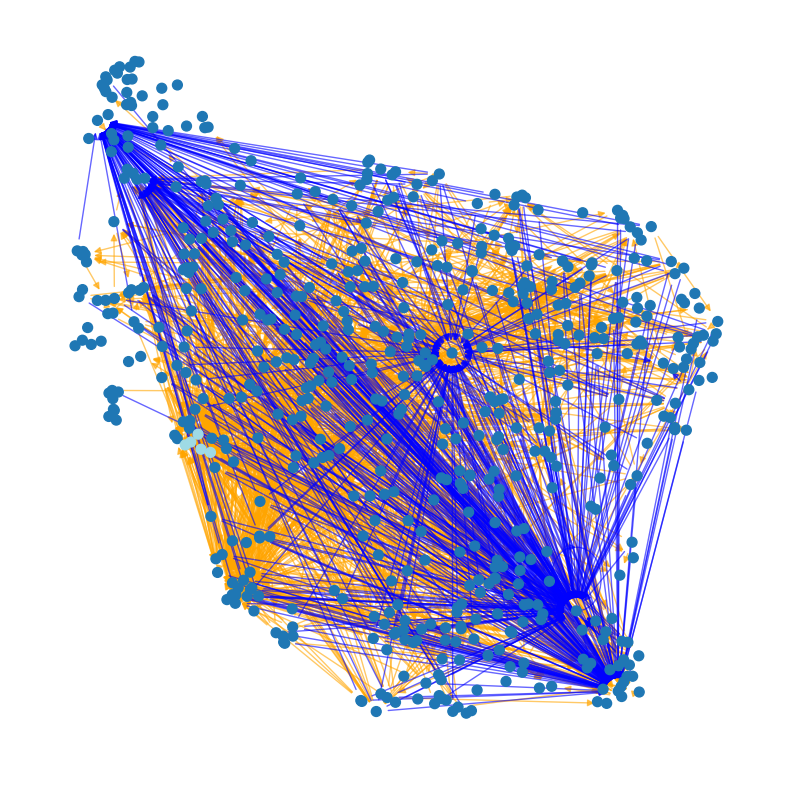

📈 Computing Ward hierarchical clustering linkage...
📉 Plotting dendrogram...


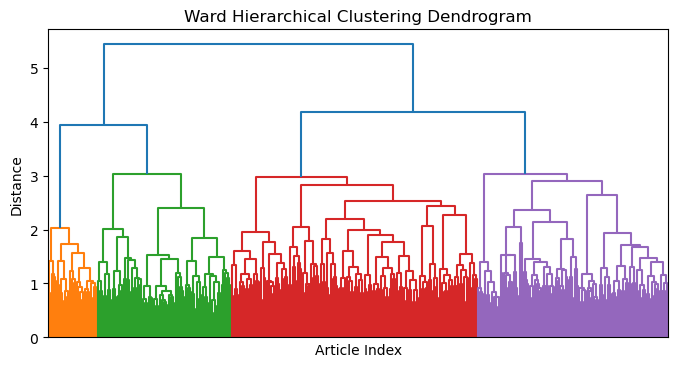

🔄 Interactive Ward clustering slider:


FloatSlider(value=1.0, description='Ward threshold:', max=5.435414544823553)

Output()

In [2]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-
"""
Script: pubmed_citation_network_full.py
Author: [Your Name]
Date: [2025-05-03]

Description:
    Builds and visualizes a PubMed citation+reference network for a given query,
    with the following features:
      • Retrieves up to MAX_RESULTS PMIDs via ESearch.
      • Fetches article metadata (titles, abstracts) and reference lists via EFetch.
      • Fetches citation links via ELink in batches to avoid per-PMID calls.
      • Constructs a directed graph with edges typed as "reference" (orange) or
        "citation" (blue).
      • Generates SBERT embeddings on GPU (if available), falls back to CPU otherwise.
      • Reduces embeddings to 2D via UMAP for node positioning.
      • Clusters embeddings with DBSCAN and assigns cluster labels.
      • Performs Ward hierarchical clustering, plots a dendrogram.
      • Provides an interactive ipywidgets slider to adjust the Ward distance
        threshold and dynamically recolor the network by cluster.

Usage:
    - Adjust PUBMED_QUERY and MAX_RESULTS as needed.
    - Run in a Jupyter notebook with ipywidgets enabled.
    - Requires: requests, pandas, networkx, matplotlib, scipy, torch,
                sentence-transformers, umap-learn, scikit-learn, ipywidgets.
"""

import requests
import time
import xml.etree.ElementTree as ET

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

import torch
from sentence_transformers import SentenceTransformer
from umap import UMAP
from sklearn.cluster import DBSCAN
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

import ipywidgets as widgets
from IPython.display import display, clear_output

# ------------------------ Configuration ------------------------

PUBMED_QUERY =  "(metformin[tiab] OR glucophage[tiab]) AND (aging[mesh] OR longevity[tiab])"
MAX_RESULTS   = 1000   # default increased from 200 to 500
ELINK_BATCH   = 100   # number of PMIDs per ELink batch

# ------------------------ PubMed API Functions ------------------------

def search_pubmed(query, retmax=MAX_RESULTS):
    print(f"🔍 Searching PubMed for up to {retmax} results...")
    url = "https://eutils.ncbi.nlm.nih.gov/entrez/eutils/esearch.fcgi"
    params = {"db": "pubmed", "term": query, "retmax": retmax, "usehistory": "y"}
    resp = requests.get(url, params=params); resp.raise_for_status()
    root = ET.fromstring(resp.content)
    pmids = [n.text for n in root.findall(".//IdList/Id")]
    webenv = root.findtext(".//WebEnv")
    qkey = root.findtext(".//QueryKey")
    print(f"  → Retrieved {len(pmids)} PMIDs.")
    return pmids, webenv, qkey

def fetch_details(pmids, webenv, qkey):
    print("📥 Fetching article metadata and reference lists via EFetch...")
    url = "https://eutils.ncbi.nlm.nih.gov/entrez/eutils/efetch.fcgi"
    params = {"db": "pubmed", "retmode": "xml", "WebEnv": webenv,
              "query_key": qkey, "retmax": len(pmids)}
    resp = requests.post(url, data=params); resp.raise_for_status()
    root = ET.fromstring(resp.content)
    articles = []
    for art in root.findall(".//PubmedArticle"):
        pmid = art.findtext(".//PMID")
        title = art.findtext(".//ArticleTitle") or ""
        abs_parts = art.findall(".//Abstract/AbstractText")
        abstract = " ".join([p.text for p in abs_parts if p.text]) or ""
        text = f"{title}. {abstract}".strip()
        refs = []
        for ref in art.findall(".//ReferenceList/Reference"):
            cited = ref.find(".//ArticleId[@IdType='pubmed']")
            if cited is not None and cited.text in pmids:
                refs.append(cited.text)
        articles.append({"pmid": pmid, "text": text, "refs": refs})
    print(f"  → Fetched details for {len(articles)} articles.")
    return articles

def fetch_citations(pmids, batch_size=ELINK_BATCH):
    print("📥 Fetching citation links via ELink in batches...")
    url = "https://eutils.ncbi.nlm.nih.gov/entrez/eutils/elink.fcgi"
    citations = {pmid: [] for pmid in pmids}
    for i in range(0, len(pmids), batch_size):
        batch = pmids[i : i + batch_size]
        print(f"    • Batch {i // batch_size + 1}: PMIDs {i+1}–{i+len(batch)}")
        params = {
            "dbfrom": "pubmed",
            "linkname": "pubmed_pubmed_citedin",
            "id": ",".join(batch)
        }
        resp = requests.get(url, params=params); resp.raise_for_status()
        root = ET.fromstring(resp.content)
        for linkset in root.findall(".//LinkSet"):
            src = linkset.findtext(".//IdList/Id")
            for link in linkset.findall(".//LinkSetDb/Link/Id"):
                if link.text in citations:
                    citations[src].append(link.text)
        time.sleep(0.34)  # respect rate limit
    total_cite_links = sum(len(v) for v in citations.values())
    print(f"  → Retrieved {total_cite_links} citation links.")
    return citations

# ------------------------ Graph Construction ------------------------

def build_graph(articles, citations):
    print("🔗 Building citation+reference graph...")
    G = nx.DiGraph()
    for art in articles:
        G.add_node(art["pmid"])
    for art in articles:
        src = art["pmid"]
        for tgt in art["refs"]:
            G.add_edge(src, tgt, type="reference")
        for citer in citations[src]:
            G.add_edge(citer, src, type="citation")
    print(f"  → Graph: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges.")
    return G

# ------------------------ Embedding & Projection ------------------------

def embed_and_project(texts):
    print("🤖 Loading SBERT model and computing embeddings...")
    model = SentenceTransformer("all-MiniLM-L6-v2")
    if torch.cuda.is_available():
        model = model.to(torch.device("cuda"))
        device = "cuda"
        print("  → Using GPU for SBERT embeddings.")
    else:
        device = "cpu"
        print("  → Using CPU for SBERT embeddings.")
    embeddings = model.encode(texts, show_progress_bar=True, device=device)
    print("🗺 Applying UMAP to reduce embeddings to 2D...")
    reducer = UMAP(n_components=2, random_state=42)
    coords = reducer.fit_transform(embeddings)
    print("  → UMAP projection complete.")
    return embeddings, coords

# ------------------------ Clustering ------------------------

def dbscan_clusters(embeddings, eps=0.5, min_samples=5):
    print("📊 Running DBSCAN clustering on embeddings...")
    db = DBSCAN(eps=eps, min_samples=min_samples).fit(embeddings)
    labels = db.labels_
    print(f"  → {len(set(labels)) - (1 if -1 in labels else 0)} clusters found (noise label = -1).")
    return labels

def compute_linkage(embeddings):
    print("📈 Computing Ward hierarchical clustering linkage...")
    Z = linkage(embeddings, method='ward')
    return Z

def plot_dendrogram(Z):
    print("📉 Plotting dendrogram...")
    plt.figure(figsize=(8,4))
    dendrogram(Z, no_labels=True)
    plt.title("Ward Hierarchical Clustering Dendrogram")
    plt.xlabel("Article Index")
    plt.ylabel("Distance")
    plt.show()

# ------------------------ Visualization ------------------------

def draw_network(G, pos, node_colors):
    plt.figure(figsize=(10,10))
    # reference edges in orange, citation edges in blue
    ref_edges = [(u,v) for u,v,d in G.edges(data=True) if d['type']=="reference"]
    cit_edges = [(u,v) for u,v,d in G.edges(data=True) if d['type']=="citation"]
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap='tab20', node_size=50)
    nx.draw_networkx_edges(G, pos, edgelist=ref_edges, edge_color='orange', alpha=0.6)
    nx.draw_networkx_edges(G, pos, edgelist=cit_edges, edge_color='blue', alpha=0.6)
    plt.axis('off')
    plt.show()

def interactive_ward(Z, G, pos):
    slider = widgets.FloatSlider(
        value=1.0, min=0.0, max=max(Z[:,2]), step=0.1,
        description='Ward threshold:'
    )
    out = widgets.Output()
    def update(change):
        with out:
            clear_output(wait=True)
            labels = fcluster(Z, t=change['new'], criterion='distance')
            color_map = [labels[i] for i,_ in enumerate(G.nodes())]
            draw_network(G, pos, color_map)
    slider.observe(update, names='value')
    display(slider, out)

# ------------------------ Main Execution (Jupyter) ------------------------

pmids, webenv, qkey = search_pubmed(PUBMED_QUERY, MAX_RESULTS)
articles = fetch_details(pmids, webenv, qkey)
citations = fetch_citations(pmids)
G = build_graph(articles, citations)

df = pd.DataFrame(articles)
embeddings, coords = embed_and_project(df['text'].tolist())
pos = {pmid: tuple(coord) for pmid, coord in zip(df['pmid'], coords)}

db_labels = dbscan_clusters(embeddings)
nx.set_node_attributes(G, {pmid: lbl for pmid, lbl in zip(df['pmid'], db_labels)}, 'db_cluster')

print("🎨 Plotting network with DBSCAN cluster colors...")
draw_network(G, pos, db_labels)

Z = compute_linkage(embeddings)
plot_dendrogram(Z)

print("🔄 Interactive Ward clustering slider:")
interactive_ward(Z, G, pos)


In [3]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-
"""
Script: test_pubmed_networks_are_dag_cleaned.py
Author: [Your Name]
Date: 2025-05-03

Description:
    For each query in QUERIES, this script:
      1. Retrieves up to SEARCH_MAX PMIDs via ESearch.
      2. Fetches full article metadata (including the earliest available publication date:
         electronic ArticleDate if present, else JournalIssue PubDate), reference lists,
         and citation links via EFetch and ELink.
      3. Computes for each article:
         • ref_count   = number of references within the initial set
         • cit_count   = number of citations within the initial set
         • total_count = ref_count + cit_count
      4. Selects the top SUBSET_N articles by total_count.
      5. Builds a directed graph on that subset, tagging edges as "reference" or 
         "citation" and omitting self-loops.
      6. Displays an interactive, scrollable table of the top articles.
      7. Identifies all “chronology violations” (edges where citing_date < cited_date),
         reports them, and identifies the offending **source** articles.
      8. Removes offending source nodes (and their edges) from the graph.
      9. Re-checks chronological coherence and DAGness on the cleaned graph.
     10. Logs structured summaries at each step.

Usage:
    - Adjust QUERIES, SEARCH_MAX, SUBSET_N, ELINK_BATCH as needed.
    - Run in a Jupyter notebook with ipywidgets enabled.
    - Requires: requests, pandas, networkx, ipywidgets.
"""

import re
import time
import datetime
import requests
import xml.etree.ElementTree as ET

import pandas as pd
import networkx as nx

from IPython.display import display
import ipywidgets as widgets

# ---------------- Configuration ----------------

QUERIES      = [
    "neoplasm metastasis[mesh] AND immunotherapy[mesh]",
    "COVID-19[mesh] AND spike glycoprotein[mesh]",
    "cardiomyopathies[mesh] AND cardiac MRI[mesh]",
    "Alzheimer disease[mesh] AND neurofilament proteins[mesh]",
    "radiology[mesh] AND deep learning[tiab] AND segmentation[tiab]",
    "CRISPR-Cas systems[mesh] AND gene knockout[mesh]"
]
SEARCH_MAX   = 1000    # number of PMIDs to retrieve per query
SUBSET_N     = 200     # number of top articles to select by total_count
ELINK_BATCH  = 100     # batch size for ELink citation retrieval

# month abbreviation to number
MONTH_MAP = {m: i for i, m in enumerate(
    ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"], 1
)}

# ---------------- PubMed Helpers ----------------

def search_pubmed(query, retmax=SEARCH_MAX):
    url = "https://eutils.ncbi.nlm.nih.gov/entrez/eutils/esearch.fcgi"
    params = {"db":"pubmed","term":query,"retmax":retmax,"usehistory":"y"}
    resp = requests.get(url, params=params); resp.raise_for_status()
    root = ET.fromstring(resp.content)
    pmids = [n.text for n in root.findall(".//IdList/Id")]
    return pmids, root.findtext(".//WebEnv"), root.findtext(".//QueryKey")

def fetch_details_with_dates(pmids, webenv, query_key):
    # Fetches ArticleDate (electronic) first, else PubDate Year/Month/Day
    url = "https://eutils.ncbi.nlm.nih.gov/entrez/eutils/efetch.fcgi"
    params = {
        "db":"pubmed","retmode":"xml",
        "WebEnv":webenv,"query_key":query_key,
        "retmax":len(pmids)
    }
    resp = requests.post(url, data=params); resp.raise_for_status()
    root = ET.fromstring(resp.content)
    articles = []
    for art in root.findall(".//PubmedArticle"):
        pmid = art.findtext(".//PMID")
        # check for ArticleDate entries
        date = None
        for ad in art.findall(".//ArticleDate"):
            if ad.get("DateType","").lower() in ("electronic","pubmed"):
                y = ad.findtext("Year"); m = ad.findtext("Month"); d = ad.findtext("Day")
                if y and y.isdigit():
                    month = int(m) if m and m.isdigit() else MONTH_MAP.get(m[:3],1)
                    day   = int(d) if d and d.isdigit() else 1
                    date = datetime.date(int(y), month, day)
                    break
        # fallback to JournalIssue PubDate
        if date is None:
            pd_node = art.find(".//Journal/JournalIssue/PubDate")
            y = pd_node.findtext("Year"); m = pd_node.findtext("Month"); d = pd_node.findtext("Day")
            if y and y.isdigit():
                month = MONTH_MAP.get(m[:3],1) if m else 1
                day   = int(d) if d and d.isdigit() else 1
                date = datetime.date(int(y), month, day)
        # references within pmids
        refs = []
        for ref in art.findall(".//ReferenceList/Reference"):
            cited = ref.find(".//ArticleId[@IdType='pubmed']")
            if cited is not None and cited.text in pmids:
                refs.append(cited.text)
        articles.append({"pmid":pmid, "date":date, "refs":refs})
    return articles

def fetch_citations_batch(pmids, batch_size=ELINK_BATCH):
    url = "https://eutils.ncbi.nlm.nih.gov/entrez/eutils/elink.fcgi"
    citations = {p:[] for p in pmids}
    for i in range(0, len(pmids), batch_size):
        batch = pmids[i:i+batch_size]
        params = {"dbfrom":"pubmed","linkname":"pubmed_pubmed_citedin","id":",".join(batch)}
        resp = requests.get(url, params=params); resp.raise_for_status()
        root = ET.fromstring(resp.content)
        for ls in root.findall(".//LinkSet"):
            src = ls.findtext(".//IdList/Id")
            for tgt in ls.findall(".//LinkSetDb/Link/Id"):
                if tgt.text in citations:
                    citations[src].append(tgt.text)
        time.sleep(0.34)
    return citations

# ---------------- Analysis Pipeline ----------------

def analyze_query(query):
    print(f"\n=== Query: {query} ===")
    pmids, we, qk = search_pubmed(query)
    print(f"1) Retrieved {len(pmids)} PMIDs")

    articles = fetch_details_with_dates(pmids, we, qk)
    citations = fetch_citations_batch(pmids)
    print("2) Fetched dates, references, citations")

    df = pd.DataFrame(articles)
    df["ref_count"]   = df["refs"].apply(len)
    df["cit_count"]   = df["pmid"].map(lambda p: len(citations[p]))
    df["total_count"] = df["ref_count"] + df["cit_count"]

    df_sorted = df.sort_values("total_count", ascending=False).reset_index(drop=True)
    df_top = df_sorted.head(SUBSET_N)
    print(f"3) Top {SUBSET_N} articles by total_count:")
    out = widgets.Output(layout={'border':'1px solid black',
                                  'height':'250px','overflow_y':'scroll'})
    with out:
        display(df_top[['pmid','date','ref_count','cit_count','total_count']])
    display(out)

    # Build graph on top N
    selected = set(df_top["pmid"])
    G = nx.DiGraph()
    for _, row in df_top.iterrows():
        G.add_node(row["pmid"], date=row["date"])
    for _, row in df_top.iterrows():
        src = row["pmid"]
        for dst in row["refs"]:
            if dst in selected and dst != src:
                G.add_edge(src, dst, type="reference")
        for dst in citations[src]:
            if dst in selected and dst != src:
                G.add_edge(src, dst, type="citation")
    print(f"4) Built graph: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

    # Identify chronology violations
    violations = []
    for u, v, d in G.edges(data=True):
        du = G.nodes[u]["date"]; dv = G.nodes[v]["date"]
        if du and dv and du < dv:
            violations.append((u, du, v, dv))
    if violations:
        print(f"5) Found {len(violations)} chronology violations:")
        # report first 5
        for u, du, v, dv in violations[:5]:
            print(f"   {u} ({du}) → {v} ({dv})")
        # remove offending source nodes
        offenders = set(u for u,_,_,_ in violations)
        print(f"   Removing {len(offenders)} offending source nodes and their edges")
        G.remove_nodes_from(offenders)
    else:
        print("5) No chronology violations detected.")

    # Re-check DAG on cleaned graph
    if nx.is_directed_acyclic_graph(G):
        print("6) Cleaned graph is a DAG.")
    else:
        print("6) Cleaned graph still has cycles!")
        cycle = next(nx.simple_cycles(G))
        print("   Example cycle:", " → ".join(cycle) + " → " + cycle[0])

# ---------------- Execute ----------------

for q in QUERIES:
    analyze_query(q)



=== Query: neoplasm metastasis[mesh] AND immunotherapy[mesh] ===
1) Retrieved 1000 PMIDs
2) Fetched dates, references, citations
3) Top 200 articles by total_count:


Output(layout=Layout(border_bottom='1px solid black', border_left='1px solid black', border_right='1px solid b…

4) Built graph: 200 nodes, 262 edges
5) Found 186 chronology violations:
   30012528 (2018-05-04) → 39543660 (2024-11-14)
   30012528 (2018-05-04) → 39337605 (2024-09-20)
   30012528 (2018-05-04) → 39090094 (2024-08-02)
   30012528 (2018-05-04) → 39080202 (2024-07-30)
   30012528 (2018-05-04) → 38992115 (2024-07-11)
   Removing 8 offending source nodes and their edges
6) Cleaned graph is a DAG.

=== Query: COVID-19[mesh] AND spike glycoprotein[mesh] ===
1) Retrieved 607 PMIDs
2) Fetched dates, references, citations
3) Top 200 articles by total_count:


Output(layout=Layout(border_bottom='1px solid black', border_left='1px solid black', border_right='1px solid b…

4) Built graph: 200 nodes, 381 edges
5) Found 188 chronology violations:
   33459559 (2021-01-18) → 39214998 (2024-08-30)
   33459559 (2021-01-18) → 39043712 (2024-07-23)
   33459559 (2021-01-18) → 38824220 (2024-06-01)
   33459559 (2021-01-18) → 38804979 (2024-06-27)
   33459559 (2021-01-18) → 38802667 (2024-05-27)
   Removing 17 offending source nodes and their edges
6) Cleaned graph is a DAG.

=== Query: cardiomyopathies[mesh] AND cardiac MRI[mesh] ===
1) Retrieved 1000 PMIDs
2) Fetched dates, references, citations
3) Top 200 articles by total_count:


Output(layout=Layout(border_bottom='1px solid black', border_left='1px solid black', border_right='1px solid b…

4) Built graph: 200 nodes, 311 edges
5) Found 211 chronology violations:
   36066609 (2022-09-06) → 39562366 (2024-11-19)
   36066609 (2022-09-06) → 39347935 (2024-09-30)
   36066609 (2022-09-06) → 39320884 (2024-11-01)
   36066609 (2022-09-06) → 39195732 (2024-08-16)
   36066609 (2022-09-06) → 39127261 (2024-08-08)
   Removing 9 offending source nodes and their edges
6) Cleaned graph is a DAG.

=== Query: Alzheimer disease[mesh] AND neurofilament proteins[mesh] ===
1) Retrieved 527 PMIDs
2) Fetched dates, references, citations
3) Top 200 articles by total_count:


Output(layout=Layout(border_bottom='1px solid black', border_left='1px solid black', border_right='1px solid b…

4) Built graph: 200 nodes, 826 edges
5) Found 157 chronology violations:
   33215849 (2020-11-20) → 39557867 (2024-11-18)
   33215849 (2020-11-20) → 39427171 (2024-10-19)
   33215849 (2020-11-20) → 39354618 (2024-10-01)
   33215849 (2020-11-20) → 39350363 (2024-01-01)
   33215849 (2020-11-20) → 39331367 (2024-09-27)
   Removing 5 offending source nodes and their edges
6) Cleaned graph is a DAG.

=== Query: radiology[mesh] AND deep learning[tiab] AND segmentation[tiab] ===
1) Retrieved 1000 PMIDs
2) Fetched dates, references, citations
3) Top 200 articles by total_count:


Output(layout=Layout(border_bottom='1px solid black', border_left='1px solid black', border_right='1px solid b…

4) Built graph: 200 nodes, 96 edges
5) Found 65 chronology violations:
   37095310 (2023-04-24) → 39567447 (2024-11-20)
   37095310 (2023-04-24) → 39520662 (2024-11-09)
   37095310 (2023-04-24) → 39330757 (2024-09-13)
   37095310 (2023-04-24) → 39266784 (2024-09-12)
   37095310 (2023-04-24) → 39227487 (2024-09-04)
   Removing 7 offending source nodes and their edges
6) Cleaned graph is a DAG.

=== Query: CRISPR-Cas systems[mesh] AND gene knockout[mesh] ===
1) Retrieved 1000 PMIDs
2) Fetched dates, references, citations
3) Top 200 articles by total_count:


Output(layout=Layout(border_bottom='1px solid black', border_left='1px solid black', border_right='1px solid b…

4) Built graph: 200 nodes, 129 edges
5) Found 90 chronology violations:
   31682806 (2019-11-02) → 39535722 (2025-01-01)
   31682806 (2019-11-02) → 39336755 (2024-09-03)
   31682806 (2019-11-02) → 36762651 (2023-03-07)
   31682806 (2019-11-02) → 35197604 (2022-02-23)
   31682806 (2019-11-02) → 34997407 (2022-01-08)
   Removing 9 offending source nodes and their edges
6) Cleaned graph is a DAG.
